# Задача 3

In [11]:
import os
from sklearn.decomposition import PCA
import scipy as sp
import numpy as np

In [12]:
import matplotlib.pyplot as plt
%pylab inline

Populating the interactive namespace from numpy and matplotlib


<class 'numpy.ndarray'> (800, 1200, 3)


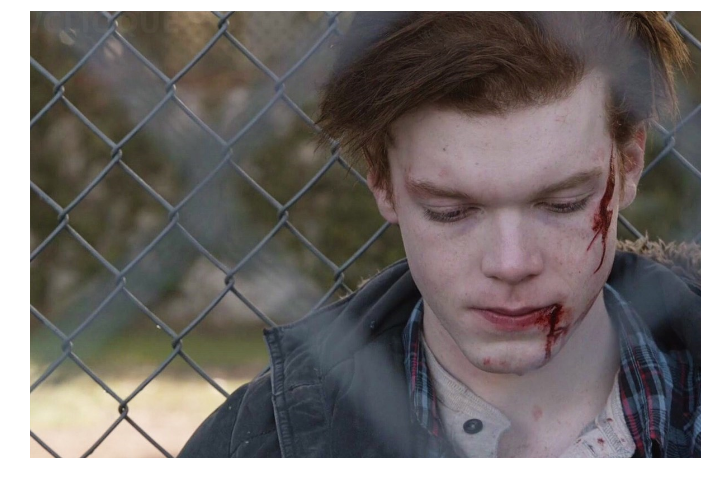

In [61]:
picture = plt.imread('Ian.png')
print(type(picture), picture.shape)

plt.figure(figsize=(12,18))
plt.imshow(picture)
plt.axis('off')
plt.show()

In [30]:
pict_resh = picture.reshape((80 * 120, 10 * 10 * 3))

In [31]:
pict_resh.shape

(9600, 300)

In [32]:
pca = PCA(n_components=20)

In [34]:
Y = pca.fit_transform(pict_resh)

In [36]:
len(Y)

9600

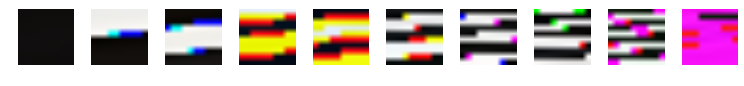

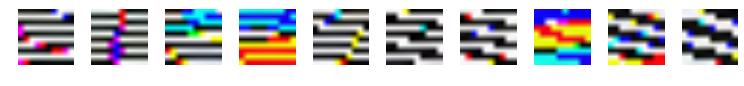

In [37]:
for i in range(2):
    plt.figure(figsize=(13, 1))
    
    for j in range(10):
        plt.subplot(1, 10, j + 1)
        plt.imshow(pca.components_[i * 10 + j].reshape((10, 10,3)))
        plt.axis('off')
    
    plt.show()

In [38]:
X_hat = pca.inverse_transform(Y)
X_hat = X_hat * (X_hat < 1) + (X_hat >= 1)   
X_hat = X_hat * (X_hat > 0)

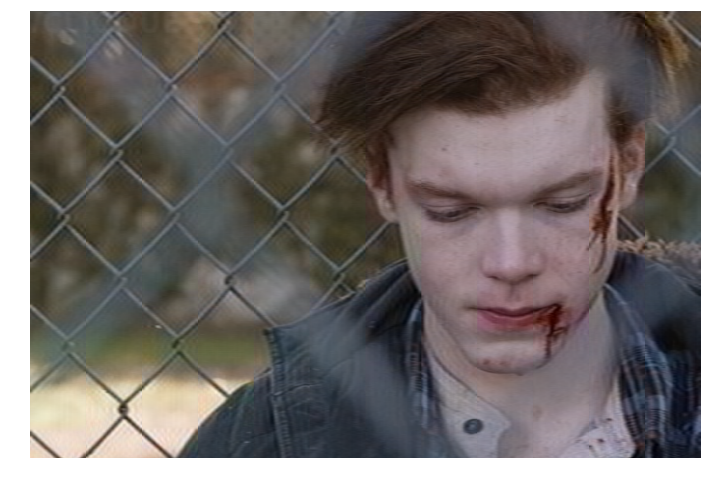

In [62]:
plt.figure(figsize=(12, 18))
plt.imshow(X_hat.reshape(800, 1200, 3))
plt.axis('off')
plt.show()

# Задача 4

In [41]:
import random
from scipy.stats import norm

In [66]:
X = picture.reshape((120 * 80, 10 * 10 * 3))
for i in range(350000):
    index_1 = np.random.randint(120 * 80)
    index_2 = np.random.randint(300)
    
    X[index_1, index_2] += norm.rvs(loc=0,scale=1)
    X[index_1, index_2] -= int(X[index_1, index_2]) 

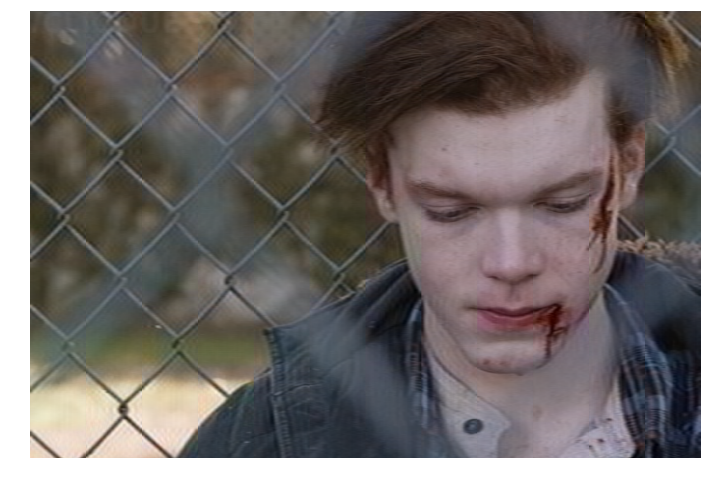

In [67]:
plt.figure(figsize=(12, 18))
plt.imshow(X_hat.reshape(800, 1200, 3))
plt.axis('off')
plt.show()

Изображение довольно неплохо восстановилось методом главных компонент.

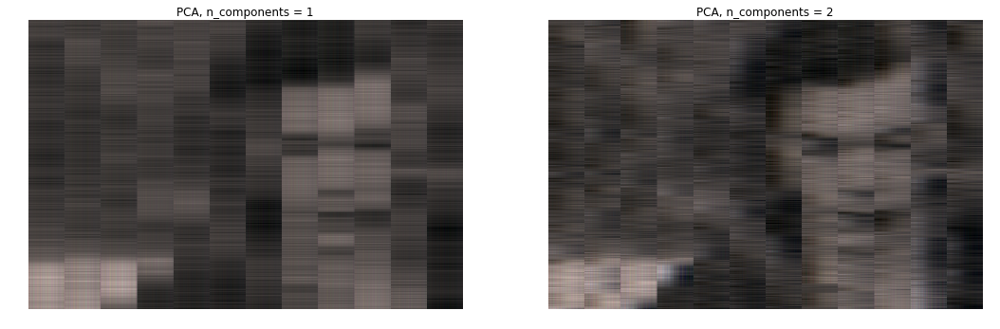

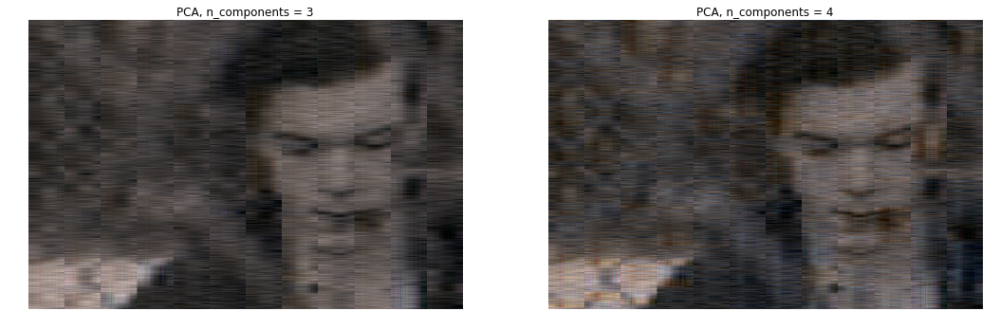

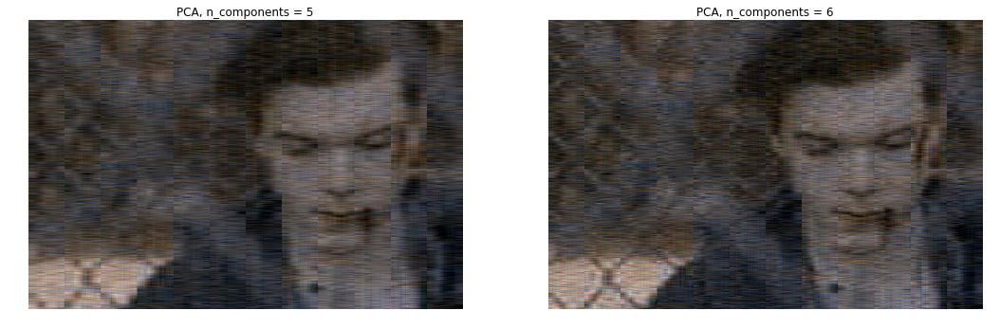

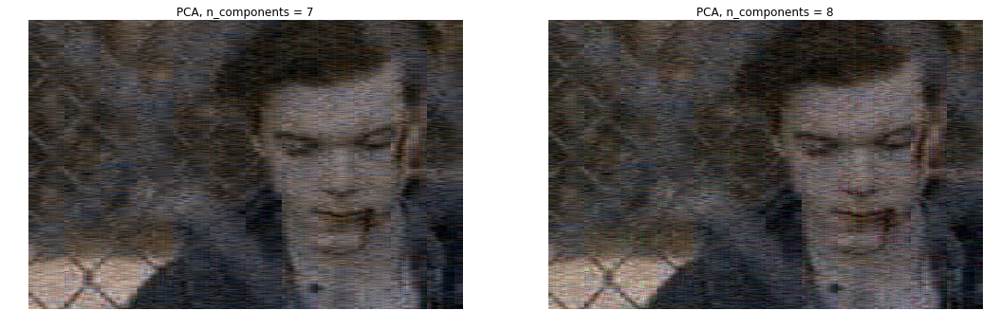

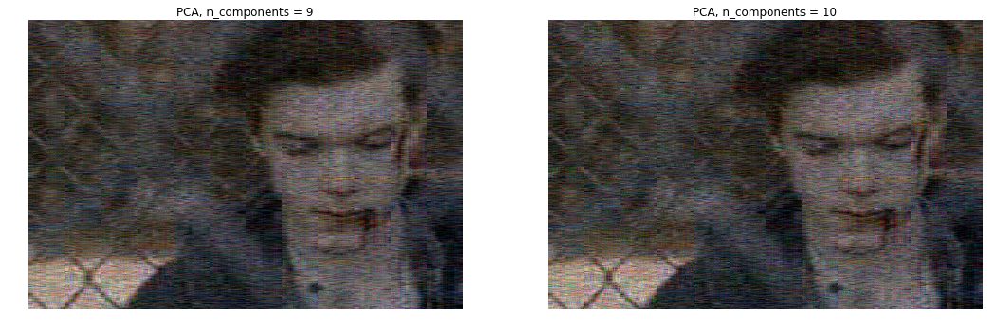

...

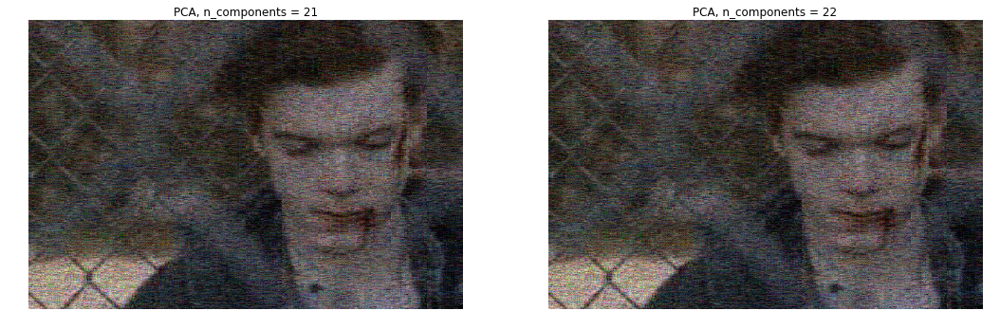

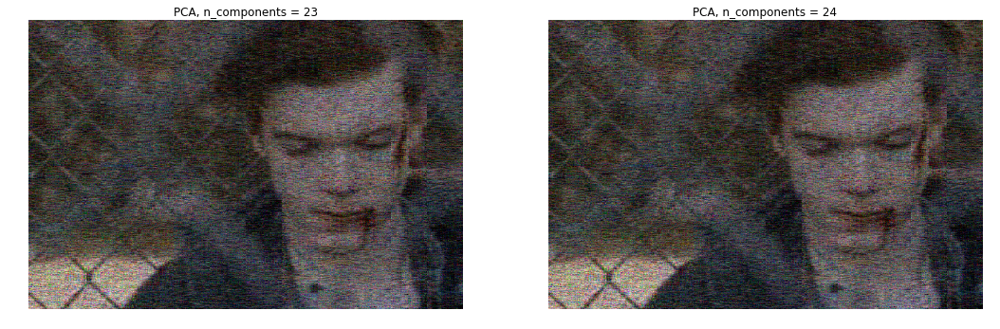

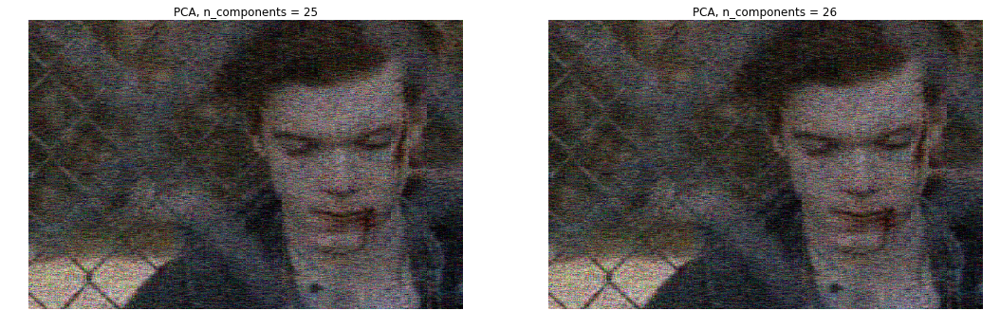

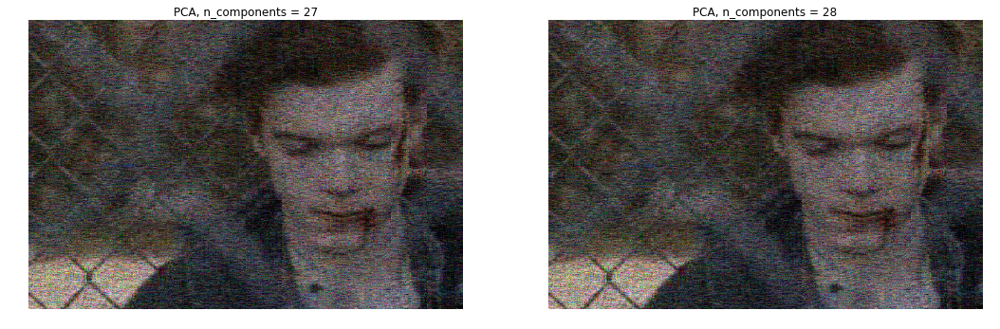

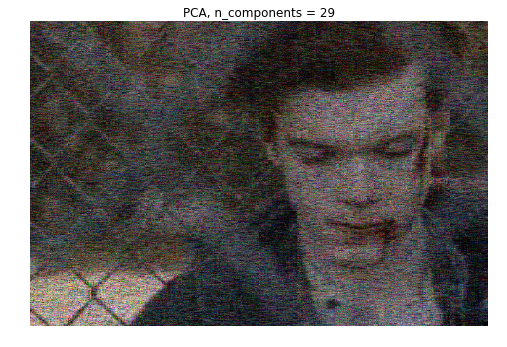

In [80]:
for i in range(1, 30):
    pca = PCA(n_components=i)
    
    Y = pca.fit_transform(X)
    X_hat = pca.inverse_transform(Y)
    X_hat = X_hat * (X_hat < 1) + (X_hat >= 1)  
    X_hat = X_hat * (X_hat > 0)
    
    if i%2 == 1:
        plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 2, 2 - (i % 2))
    plt.imshow(X_hat.reshape(800, 1200, 3))
    plt.title("PCA, n_components = {}".format(i))
    plt.axis('off')
    
    if i%2 == 0:
        plt.show()

In [ ]:
Изображение хорошо восстановить не удалось. Начиная примерно с 20 компонент качество не улучшается.